## Importar las librerías a utilizar

In [1]:
import pandas as pd
from ydata_profiling import ProfileReport   
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline 

## Importar el conjunto de datos

In [2]:
datos = pd.read_csv('movies.csv')
X = datos.iloc[:, :]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

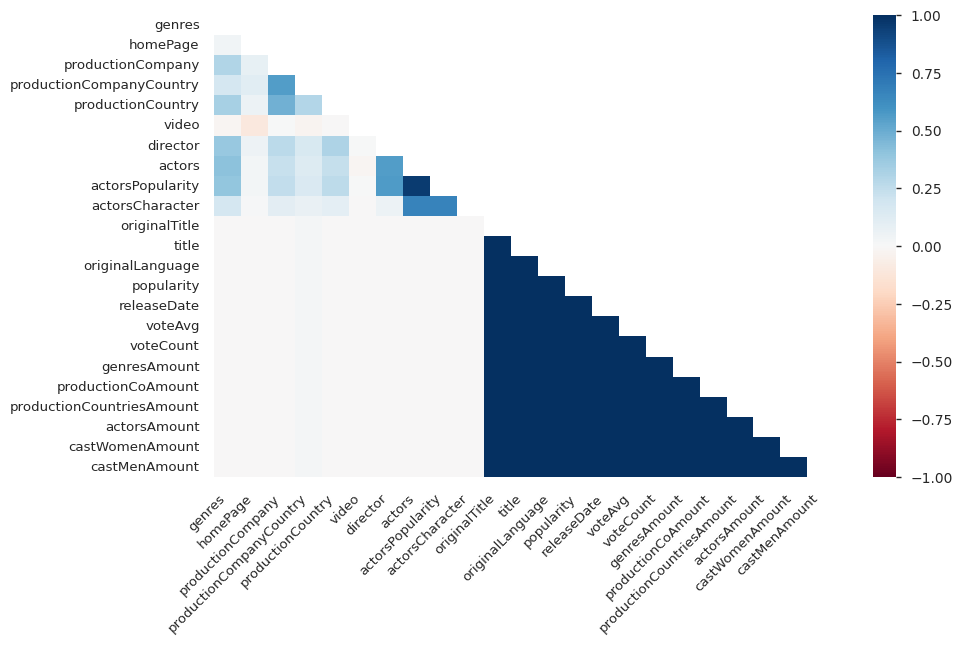

In [138]:
profile = ProfileReport(datos)
profile

### 0. Limpieza de datos

In [3]:
#Eliminar datos texto en budget
X = X.drop(X[X['budget'].str.contains('e')].index)

# Pasar a valores enteros los valores de budget
X['budget'] = X['budget'].astype(int)

# En los valores de budget que son 0, cambiarlos por la media de budget
X['budget'] = X['budget'].replace(0, X['budget'].mean())

# Cambiar solo los valores nulls en genres por la moda
X['genres'] = X['genres'].fillna(X['genres'].mode()[0])

# Imputar revenue
X['revenue'] = X['revenue'].replace(0, X['revenue'].mean())

# Imputar runtime
X = X.fillna(X.mean(numeric_only = True)[8:9])
X['runtime'] = X['runtime'].replace(0, X['runtime'].mean())

# Cambiar valores nulos en director por 'Unknown'
X['director'] = X['director'].fillna('Unknown')

# Eliminar filas que tienen valores nulos en voteAvg
X = X.dropna(axis = 0, subset = ['voteAvg'])

# Reemplazar not a numbers por 0 en castMenAmount
X['castMenAmount'] = pd.to_numeric(X['castWomenAmount'], errors='coerce')

# Reemplazar not a numbers por 0 en castWomenAmount
X['castWomenAmount'] = pd.to_numeric(X['castWomenAmount'], errors='coerce')

In [140]:
# La limpieza de los datos queda con estos valores nulos: 
print(X.isnull().sum())

# Los campos que no fueron limpiados no son relevantes para el análisis del estudio

id                              0
budget                          0
genres                          0
homePage                     5806
productionCompany             457
productionCompanyCountry     1279
productionCountry             233
revenue                         0
runtime                         0
video                         486
director                        0
actors                         80
actorsPopularity               87
actorsCharacter                47
originalTitle                   0
title                           0
originalLanguage                0
popularity                      0
releaseDate                     0
voteAvg                         0
voteCount                       0
genresAmount                    0
productionCoAmount              0
productionCountriesAmount       0
actorsAmount                    0
castWomenAmount                37
castMenAmount                  37
dtype: int64


In [141]:
import matplotlib.pyplot as plt


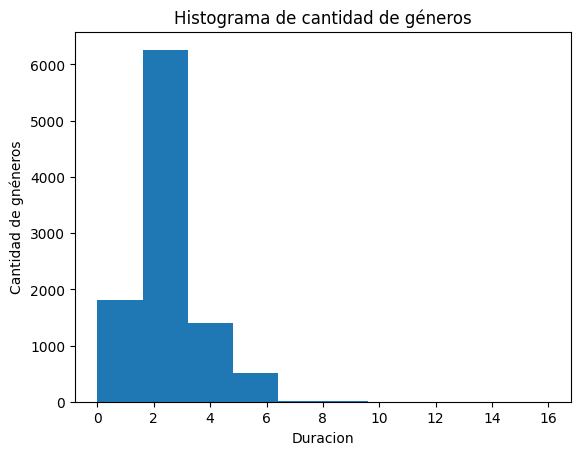

In [142]:
plt.hist(X['genresAmount'])
plt.xlabel('Duracion')
plt.ylabel('Cantidad de gnéneros')
plt.title('Histograma de cantidad de géneros')
plt.show()

Tabla de frecuencias de productionCompany

In [143]:

productionCompanies = datos['productionCompany'].str.split('|').explode()

productionCompanies = productionCompanies.str.strip()

newProfile = productionCompanies.value_counts()

print(profile)

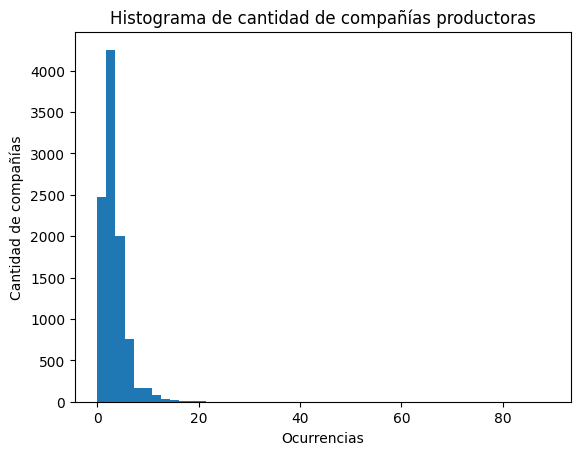

In [144]:
plt.hist(X['productionCoAmount'], bins=50)
plt.xlabel('Ocurrencias')
plt.ylabel('Cantidad de compañías')
plt.title('Histograma de cantidad de compañías productoras')
plt.show()

In [145]:
productionCompanyCountries = datos['productionCompanyCountry'].str.split('|').explode()

productionCompanyCountries = productionCompanyCountries.str.strip()

newProfile = productionCompanyCountries.value_counts()

print(newProfile)

productionCompanyCountry
US           12675
              7735
JP            1604
FR            1478
GB            1413
             ...  
Argentina        1
Spain            1
SK               1
MK               1
Mexico           1
Name: count, Length: 87, dtype: int64


In [146]:
productionCountries  = datos['productionCountry'].str.split('|').explode()

productionCountries = productionCountries.str.strip()

newProfile = productionCountries.value_counts()

print(newProfile)

productionCountry
United States of America    6788
United Kingdom              1171
Japan                        731
France                       668
Canada                       634
                            ... 
Libyan Arab Jamahiriya         1
Kuwait                         1
Tunisia                        1
Vietnam                        1
Slovakia                       1
Name: count, Length: 112, dtype: int64


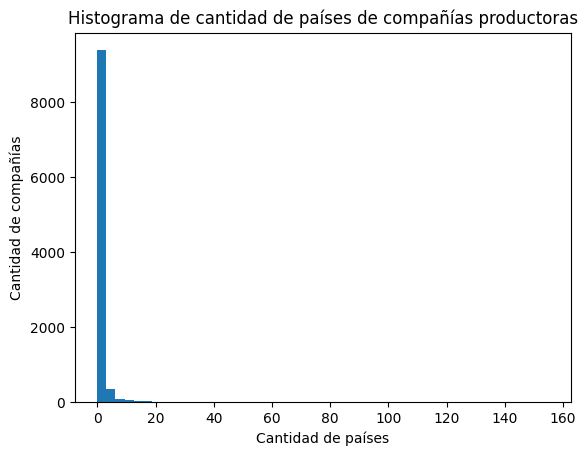

In [147]:
plt.hist(X['productionCountriesAmount'], bins=50)
plt.xlabel('Cantidad de países')
plt.ylabel('Cantidad de compañías')
plt.title('Histograma de cantidad de países de compañías productoras')
plt.show()

In [148]:
releaseDates  = datos['releaseDate'].str.split('|').explode()

releaseDates  = releaseDates .str.strip()

newProfile = releaseDates .value_counts()

print(newProfile)

releaseDate
2021-10-08    15
2021-02-12    15
2021-10-01    14
2021-11-12    12
2021-07-23    11
              ..
2006-10-21     1
1948-05-27     1
1998-08-04     1
2008-08-29     1
2021-10-31     1
Name: count, Length: 5567, dtype: int64


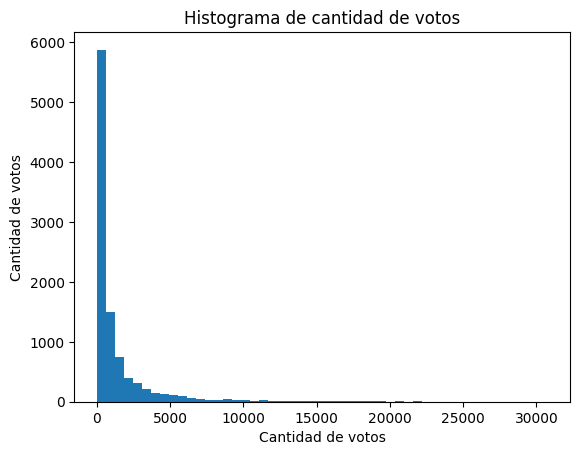

In [149]:
plt.hist(X['voteCount'], bins=50)
plt.xlabel('Cantidad de votos')
plt.ylabel('Cantidad de votos')
plt.title('Histograma de cantidad de votos')
plt.show()

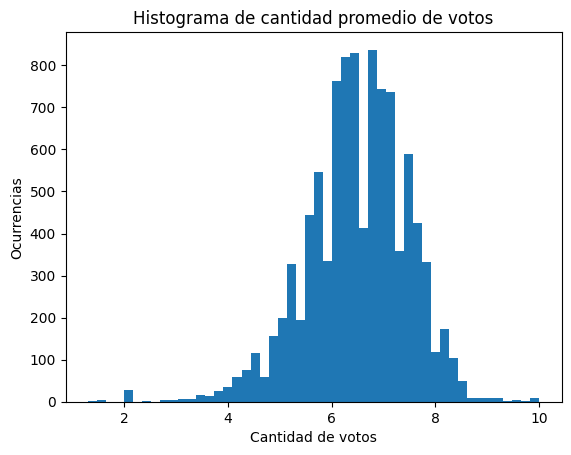

In [150]:
plt.hist(X['voteAvg'], bins=50)
plt.xlabel('Cantidad de votos')
plt.ylabel('Ocurrencias')
plt.title('Histograma de cantidad promedio de votos')
plt.show()

In [151]:
actors  = datos['actors'].str.split('|').explode()

actors  = actors.str.strip()

newProfile = actors.value_counts()

print(newProfile)

actors
FALSE              480
Frank Welker       143
Grey DeLisle        97
Jeff Bennett        91
Fred Tatasciore     86
                  ... 
Lindsay Maxwell      1
Susan Hogan          1
Aileen Sander        1
Quinton Flynn        1
Nedu Wazobia         1
Name: count, Length: 132625, dtype: int64


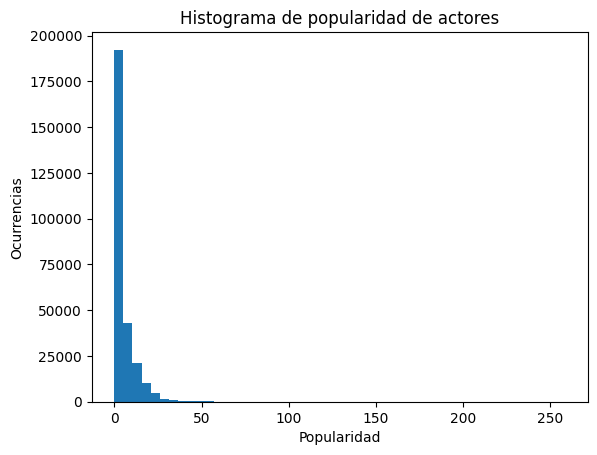

In [152]:
actorsPopularity  = datos['actorsPopularity'].str.split('|').explode()
actorsPopularity   = actorsPopularity .str.strip()
newProfile = actorsPopularity .value_counts()
actorsPopularity_numeric = pd.to_numeric(actorsPopularity, errors='coerce')
actorsPopularity_numeric = actorsPopularity_numeric.dropna()
plt.hist(actorsPopularity_numeric, bins=50)
plt.xlabel('Popularidad')
plt.ylabel('Ocurrencias')
plt.title('Histograma de popularidad de actores')
plt.show()


In [153]:
actorsCharacter  = datos['actorsCharacter'].str.split('|').explode()

actorsCharacter  = actorsCharacter.str.strip()

newProfile = actorsCharacter.value_counts()

print(newProfile)

actorsCharacter
                             4474
Self                         1723
Additional Voices (voice)    1566
Himself                      1445
Dancer                       1008
                             ... 
Charity Burbage                 1
Hermione's Mum                  1
Hermione's Dad                  1
Albert Runcorn                  1
922162                          1
Name: count, Length: 164007, dtype: int64


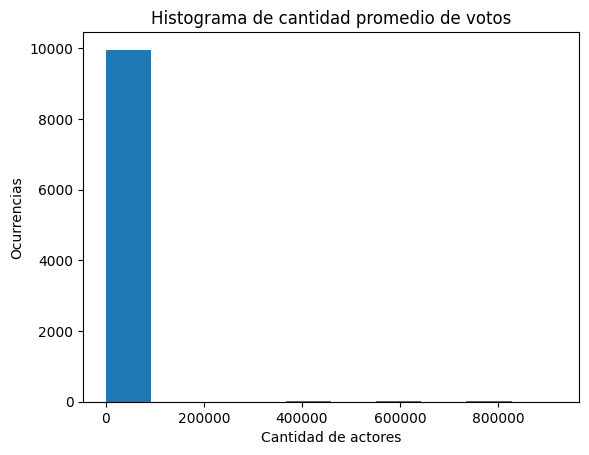

In [154]:
plt.hist(X['actorsAmount'], bins=10)
plt.xlabel('Cantidad de actores')
plt.ylabel('Ocurrencias')
plt.title('Histograma de cantidad promedio de votos')
plt.show()

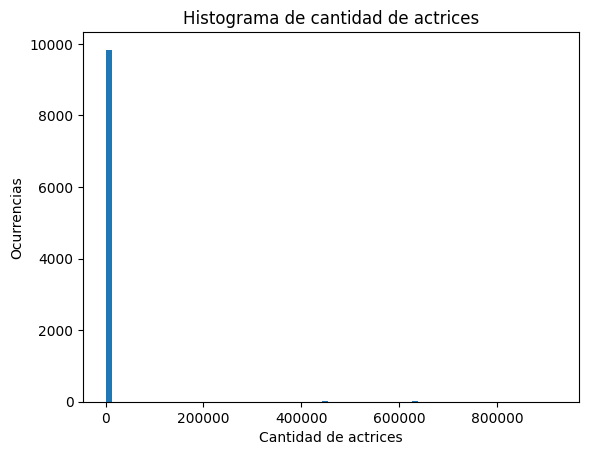

In [155]:
castWomen = X['castWomenAmount'] = pd.to_numeric(X['castWomenAmount'], errors='coerce')

castWomen = castWomen.dropna()

plt.hist(castWomen, bins=75)
plt.xlabel('Cantidad de actrices')
plt.ylabel('Ocurrencias')
plt.title('Histograma de cantidad de actrices')
plt.show()

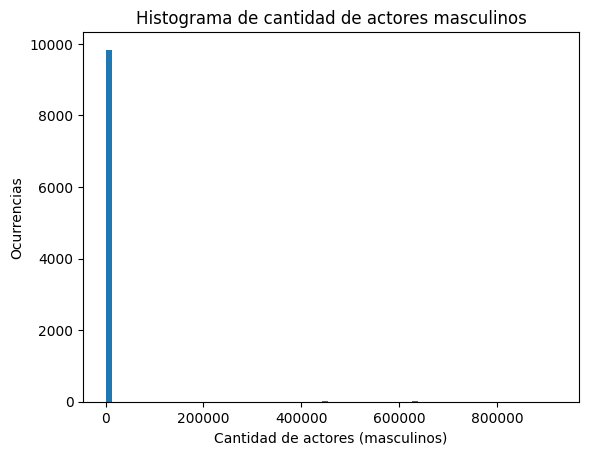

In [156]:
castMen = pd.to_numeric(X['castMenAmount'], errors='coerce')

castMen = castMen.dropna()

plt.hist(castMen, bins=75)
plt.xlabel('Cantidad de actores (masculinos)')
plt.ylabel('Ocurrencias')
plt.title('Histograma de cantidad de actores masculinos')
plt.show()

# Ejercicio 4

#### 4.1 ¿Cuáles son las 10 películas que contaron con más presupuesto?

In [157]:
print(X[['title', 'budget']].sort_values(by = 'budget', ascending = False).head(10))

                                            title       budget
716   Pirates of the Caribbean: On Stranger Tides  380000000.0
4711                      Avengers: Age of Ultron  365000000.0
5953                            Avengers: Endgame  356000000.0
5954                       Avengers: Infinity War  300000000.0
4954                               Justice League  300000000.0
163      Pirates of the Caribbean: At World's End  300000000.0
607                              Superman Returns  270000000.0
3792                                      Tangled  260000000.0
7135                                The Lion King  260000000.0
280                                  Spider-Man 3  258000000.0


La película con más presupuesto tiene una inversión de 380000000.0 que es: "Pirates of the Caribbean: On Stranger Tides"

#### 4.2 ¿Cuáles son las 10 películas que más ingresos tuvieron?

In [158]:
print(X[['title', 'revenue']].sort_values(by = 'revenue', ascending = False).head(10))

                             title       revenue
3211                        Avatar  2.847246e+09
5953             Avengers: Endgame  2.797801e+09
307                        Titanic  2.187464e+09
4948  Star Wars: The Force Awakens  2.068224e+09
5954        Avengers: Infinity War  2.046240e+09
4915                Jurassic World  1.671713e+09
7135                 The Lion King  1.667635e+09
9050       Spider-Man: No Way Home  1.631853e+09
3398                  The Avengers  1.518816e+09
5088                     Furious 7  1.515048e+09


La película con más ingresos fue Avatar con 2,847,246,000 dólares aproximadamente

#### 4.3 ¿Cuál es la película que más votos tuvo?

In [160]:
print(X[['title', 'voteCount']].sort_values(by = 'voteCount', ascending = False).head(1))

          title  voteCount
3512  Inception    30788.0


La película con más votos es Inception con un total de 30788

#### 4.4 ¿Cuál es la peor película de acuerdo a los votos de todos los usuarios?

In [161]:
print(X[['title', 'voteAvg']].sort_values(by = 'voteAvg', ascending = True).head(1))

                                                  title  voteAvg
9787  DAKAICHI -I'm Being Harassed by the Sexiest Ma...      1.3


La peor película en votos es DAKAICHI -I'm Being Harassed by the Sexiest Ma... con 1.3 de promedio en votos

#### 4.5 ¿Cuántas películas se hicieron en cada año? ¿En qué año se hicieron más películas? Haga un gráfico de barras

In [162]:
print(X['releaseDate'].str[:4].value_counts())

releaseDate
2021    816
2018    629
2017    618
2019    612
2016    557
       ... 
1936      1
1929      1
1926      1
1902      1
1935      1
Name: count, Length: 99, dtype: int64


En 2021 se hicieron más películas. Los datos llegan hasta enero 2022. Se puede observar que los años con mayor cantidad de películas son de los últimos 6 años respecto a la data.

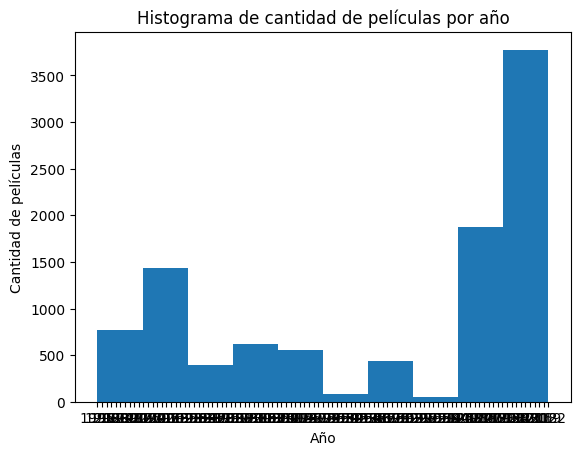

In [163]:
plt.hist(X['releaseDate'].str[:4])
plt.xlabel('Año')
plt.ylabel('Cantidad de películas')
plt.title('Histograma de cantidad de películas por año')
plt.show()

#### 4.6 ¿Cuál es el género principal de las 20 películas más recientes? ¿Cuál es el género principal que predomina en el conjunto de datos? Represéntelo usando un gráfico

In [164]:
data = X[['genres', 'releaseDate']].sort_values(by='releaseDate', ascending=False).head(20)
df = pd.DataFrame(data)
df['main_genre'] = df['genres'].str.split('|').str[0]
frecuencia_main_genero = df['main_genre'].value_counts()
print(frecuencia_main_genero)

main_genre
Drama          6
Comedy         6
Action         3
Thriller       1
Documentary    1
Romance        1
Animation      1
Horror         1
Name: count, dtype: int64


El género principal de las 20 películas más recientes es Drama y Comedia con 6 películas

In [165]:
data = X['genres']
df = pd.DataFrame(data)
df['main_genre'] = df['genres'].str.split('|').str[0]
frecuencia_main_genero = df['main_genre'].value_counts()
print(frecuencia_main_genero)
# Agregar main genre al dataframe
X['main_genre'] = X['genres'].str.split('|').str[0]

main_genre
Drama              1856
Comedy             1519
Action             1518
Horror              901
Animation           811
Thriller            553
Adventure           541
Crime               376
Family              374
Romance             321
Science Fiction     305
Documentary         259
Fantasy             241
Mystery             104
Music                98
War                  80
Western              61
TV Movie             46
History              35
Name: count, dtype: int64


El género principal de todas las películas es Drama con una cantidad de 1856 películas

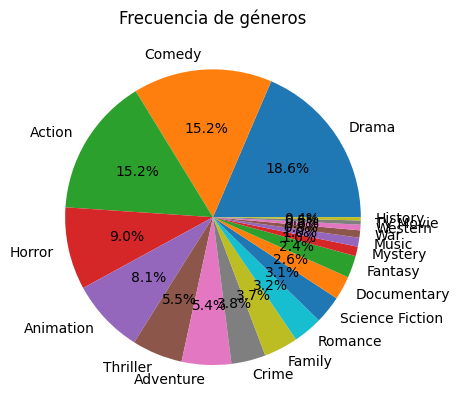

In [166]:
plt.pie(frecuencia_main_genero, labels = frecuencia_main_genero.index, autopct='%1.1f%%')
plt.title('Frecuencia de géneros')
plt.show()

#### 4.7 ¿Las películas de qué genero principal obtuvieron mayores ganancias?

In [167]:
print(X[['main_genre', 'revenue']].sort_values(by='revenue', ascending=False).head(20))

           main_genre       revenue
3211           Action  2.847246e+09
5953        Adventure  2.797801e+09
307             Drama  2.187464e+09
4948           Action  2.068224e+09
5954        Adventure  2.046240e+09
4915           Action  1.671713e+09
7135        Adventure  1.667635e+09
9050           Action  1.631853e+09
3398  Science Fiction  1.518816e+09
5088           Action  1.515048e+09
6181           Family  1.450027e+09
4711           Action  1.405404e+09
5799           Action  1.346739e+09
2510          Fantasy  1.341511e+09
5149  Science Fiction  1.332699e+09
6429           Action  1.303460e+09
4766        Animation  1.274219e+09
6109           Family  1.263521e+09
5626           Action  1.242805e+09
6272           Action  1.238765e+09


Las películas de Acción son las que mayor ganancia generan con un total acumulado de 2.847246e+09

#### 4.8¿La cantidad de actores influye en los ingresos de las películas?¿se han hecho películas con más actores en los últimos años?

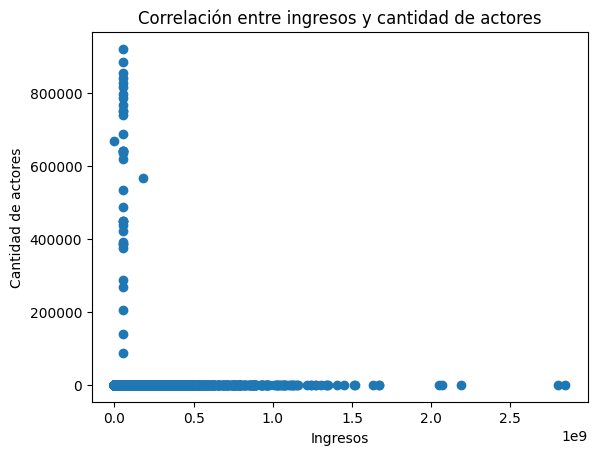

In [168]:
plt.scatter(X['revenue'], X['actorsAmount'])
plt.xlabel('Ingresos')
plt.ylabel('Cantidad de actores')
plt.title('Correlación entre ingresos y cantidad de actores')
plt.show()


A primera vista no tienen ninguna relación, sin embargo, puede ser útil limpiar los datos atípicos de la cantidad de actores

In [169]:
# Limpiar datos atípicos en cantidad de actores
X = X.drop(X[X['actorsAmount'] > 10000].index)

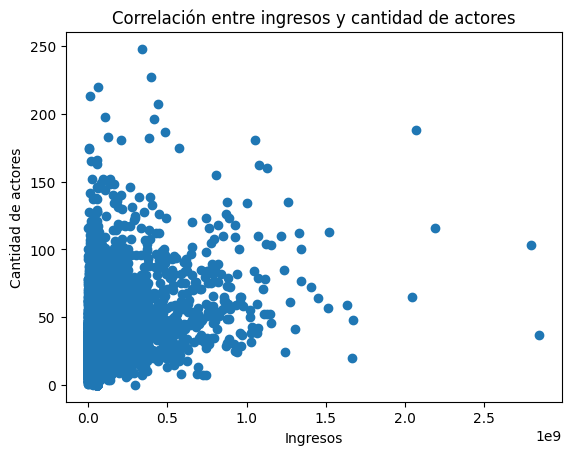

0.3576305555363357


In [170]:
plt.scatter(X['revenue'], X['actorsAmount'])
plt.xlabel('Ingresos')
plt.ylabel('Cantidad de actores')
plt.title('Correlación entre ingresos y cantidad de actores')
plt.show()
print(X['revenue'].corr(X['actorsAmount']))

Existe una muy baja correlación entre la cantidad de actores e ingresos de la película, por lo que no puede simplemente concluirse que tienen una relación

In [171]:
# Cantidad de actores por año
releaseYear = X['releaseDate'].str[:4]
X['releaseYear'] = releaseYear
actorsPYear = X[['releaseYear', 'actorsAmount']].sort_values(by='releaseYear', ascending=False).head(20).groupby('releaseYear').sum()
print(actorsPYear)

             actorsAmount
releaseYear              
2021                238.0
2022                 85.0


Al contrario, la cantidad de actores ha disminuido en los últimos años.

#### 4.9 ¿Es posible que la cantidad de hombres y mujeres en el reparto influya en la popularidad y los ingresos de las películas?

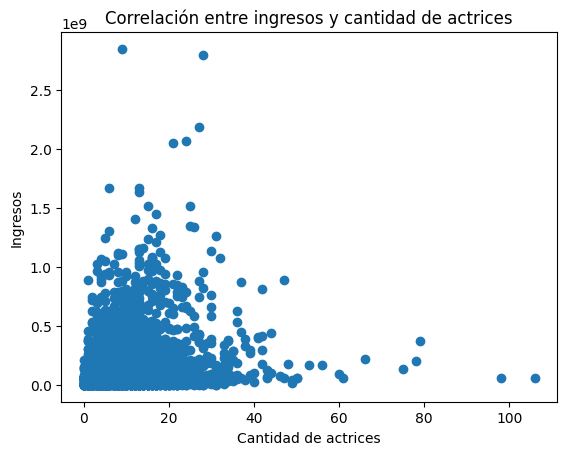

0.24715575216039767


In [172]:
X = X.drop(X[X['castWomenAmount'] > 10000].index)
plt.scatter(X['castWomenAmount'], X['revenue'])
plt.xlabel('Cantidad de actrices')
plt.ylabel('Ingresos')
plt.title('Correlación entre ingresos y cantidad de actrices')
plt.show()
print(X['castWomenAmount'].corr(X['revenue']))

La cantidad de actrices en el reparto no influye en los ingresos de las películas

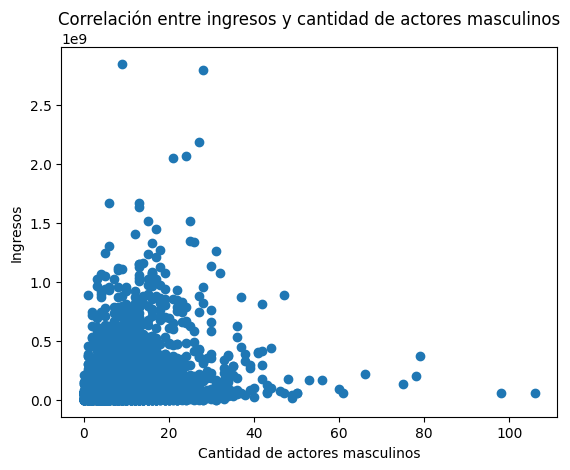

0.24715575216039767


In [173]:
X = X.drop(X[X['castMenAmount'] > 10000].index)
plt.scatter(X['castMenAmount'], X['revenue'])
plt.xlabel('Cantidad de actores masculinos')
plt.ylabel('Ingresos')
plt.title('Correlación entre ingresos y cantidad de actores masculinos')
plt.show()
print(X['castMenAmount'].corr(X['revenue']))

La cantidad de actores masculinos no influye en los ingresos de la película

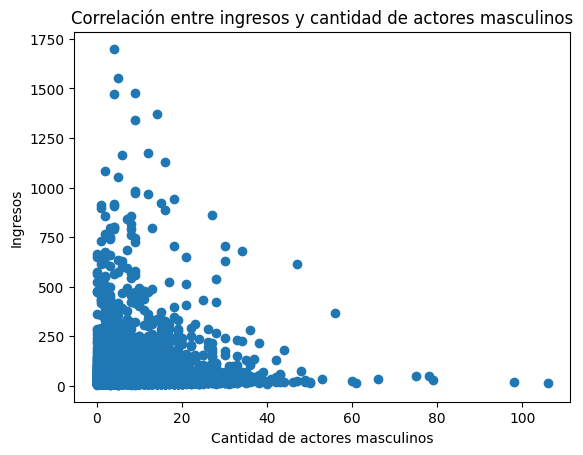

0.0680762060925973


In [174]:
X = X.drop(X[X['castMenAmount'] > 10000].index)
X = X.drop(X[X['popularity'] > 2000].index)
plt.scatter(X['castMenAmount'], X['popularity'])
plt.xlabel('Cantidad de actores masculinos')
plt.ylabel('Ingresos')
plt.title('Correlación entre ingresos y cantidad de actores masculinos')
plt.show()
print(X['castMenAmount'].corr(X['popularity']))

La cantidad de actores masculinos y su popularidad tienen una relación de curva-S

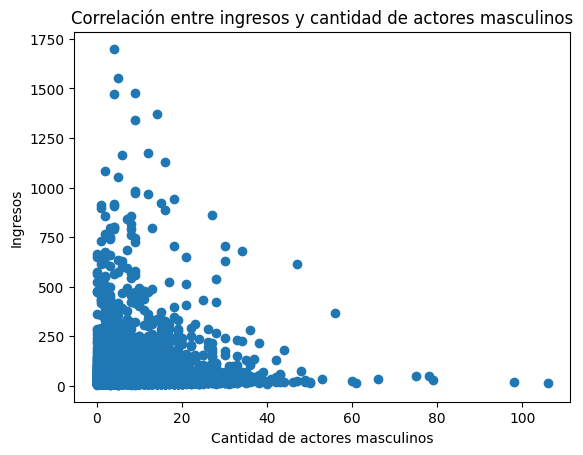

0.0680762060925973


In [175]:
X = X.drop(X[X['castWomenAmount'] > 10000].index)
X = X.drop(X[X['popularity'] > 2000].index)
plt.scatter(X['castWomenAmount'], X['popularity'])
plt.xlabel('Cantidad de actores masculinos')
plt.ylabel('Ingresos')
plt.title('Correlación entre ingresos y cantidad de actores masculinos')
plt.show()
print(X['castWomenAmount'].corr(X['popularity']))

La cantidad de actrices parece relacionarse con la popularidad en una curva-S

#### 4.10 ¿Quiénes son los directores que hicieron las 20 películas mejor calificadas?

In [176]:
print(X[['director', 'voteAvg']].sort_values(by='voteAvg', ascending=False).head(20))

                                               director  voteAvg
9734                                     Christin Baker     10.0
9247                                      Rebecca Sugar     10.0
8633                                       Thomas Coven     10.0
9348                                       Kaku Arakawa     10.0
9991                                Miguel Angel Zavala     10.0
6886             Dave Bullock|Troy Adomitis|Victor Cook      9.6
6171                                       Samuel Leong      9.5
9369                                     Won Myeong-jun      9.5
9757                                     Haruo Sotozaki      9.3
9784                                     Haruo Sotozaki      9.3
8266                                    Ulises Valencia      9.2
9778                                       Igor Kopylov      9.2
9542                                            Unknown      9.2
9452                                       Park Jun-soo      9.2
9220  Kim Nam-joon|Jeon J

Entre los directores que hicieron las 20 películas mejor calificadas está Christian Baker, Rebecca Sugar, Thomas, Coven, etc. Puede observarse que Haruo Sotozaki aparece dos veces en esta tabla, esto debido a que él es el director de 2 de las 20 películas mejor calificadas.

#### 4.11¿Cómo se correlacionan los presupuestos con los ingresos? ¿Los altos presupuestos significan altos ingresos? Haga los gráficos que necesite, histograma, diagrama de dispersión

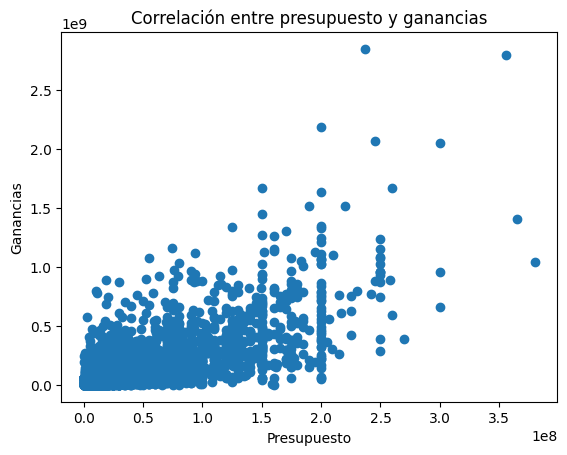

0.7239318510858236


In [16]:
plt.scatter(X['budget'], X['revenue'])
plt.xlabel('Presupuesto')
plt.ylabel('Ganancias')
plt.title('Correlación entre presupuesto y ganancias')
plt.show()

print(X['budget'].corr(X['revenue']))

Hay una fuerte tendencia entre el presupuesto y las ganancias teniendo un r = 0.72. Esto indica que una gran mayoría de películas con alta inversión tendrá grandes ganancias. Además, en el scatter se aprecia el comportamiento positivo que tienen ambas variables

#### 4.12 ¿Se asocian ciertos meses de lanzamiento con mejores ingresos?

In [17]:
X['releaseDate'] = pd.to_datetime(X['releaseDate'])
X['releaseMonth'] = X['releaseDate'].dt.month

revenue_por_mes = X.groupby('releaseMonth')['revenue'].sum()
print(revenue_por_mes.sort_values(ascending = False))

releaseMonth
6     9.751289e+10
12    9.346896e+10
7     8.142336e+10
11    8.016235e+10
5     7.986942e+10
10    7.439099e+10
3     6.356033e+10
9     6.327417e+10
8     5.831601e+10
4     5.572726e+10
2     4.964093e+10
1     4.102765e+10
Name: revenue, dtype: float64


Como se puede apreciar, los meses de final de semestre son los que más ganancia obtienen. Además, hay una gran diferencia entre Junio y Enero, por lo que si podría existir gran relación. (Al ser los meses una variable categórica no se puede hacer un histograma o coeficiente de correlación)

#### 4.13 ¿En qué meses se han visto los lanzamientos con mejores ingresos?¿cuantas películas, en promedio, se han lanzado por mes?

In [5]:
X['releaseMonth'] = X['releaseDate'].str[5:7]
print(X[['releaseMonth', 'revenue']].sort_values(by='revenue', ascending=False).head(20))

     releaseMonth       revenue
3211           12  2.847246e+09
5953           04  2.797801e+09
307            11  2.187464e+09
4948           12  2.068224e+09
5954           04  2.046240e+09
4915           06  1.671713e+09
7135           07  1.667635e+09
9050           12  1.631853e+09
3398           04  1.518816e+09
5088           04  1.515048e+09
6181           11  1.450027e+09
4711           04  1.405404e+09
5799           02  1.346739e+09
2510           07  1.341511e+09
5149           12  1.332699e+09
6429           06  1.303460e+09
4766           11  1.274219e+09
6109           03  1.263521e+09
5626           06  1.242805e+09
6272           04  1.238765e+09


Se puede observar que los meses de lanzamientos de películas con mejores ingresos, suele ser cerca de las "vacaciones" en algunos países, dígase noviembre,diciembre, o abril a junio.

In [6]:
# Cantidad de películas promedio por mes
cantidadPeliculasPMes = X['releaseMonth'].value_counts().mean()
print(cantidadPeliculasPMes)

833.25


Se han lanzado aproximadamente 833 películas por mes

#### 4.14 ¿Cómo se correlacionan las calificaciones con el éxito comercial?

Tomaremos el éxito comercial como ingresos y "las calificaciones" como el promedio de calificación de la película

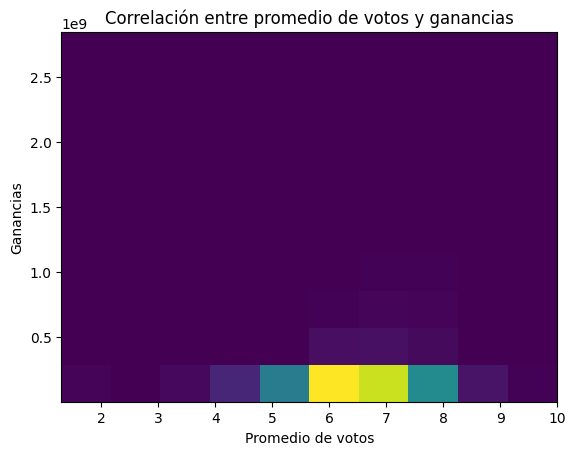

In [8]:
plt.scatter(X['voteAvg'], X['revenue'])
plt.xlabel('Promedio de votos')
plt.ylabel('Ganancias')
plt.title('Correlación entre promedio de votos y ganancias')
plt.show()


#### 4.15 ¿A qué género principal pertenecen las películas más largas?

In [18]:
print(X[['main_genre', 'runtime']].sort_values(by='runtime', ascending=False).head(20))

       main_genre  runtime
9348  Documentary    750.0
5359  Documentary    400.0
3886        Drama    333.0
963         Drama    317.0
1264        Drama    248.0
7066       Action    247.0
1949        Drama    242.0
9687       Action    242.0
3741  Documentary    240.0
6160       Action    240.0
5593       Action    240.0
2949        Crime    237.0
414         Drama    233.0
9220        Music    231.0
176         Drama    229.0
516           War    227.0
364        Action    222.0
1169        Drama    220.0
9769       Comedy    213.0
4278  Documentary    213.0


El género con las dos películas más largas es Documental. Además, dentro de las 20 películas más largas, el género principal que más se repite es Drama